<a href="https://colab.research.google.com/github/darpan-jain/gene-disease-associations/blob/develop/PPI_String_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import networkx as nx
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

In [2]:
import pandas as pd
import os

data = []
csv_directory = r'/content/'

for filename in os.listdir(csv_directory):
    if filename.lower().endswith('.csv'):
         df = pd.read_csv(r'/content/GDA_associations.csv')

df

,Unnamed: 0,geneid,gene_symbol,uniprotid,gene_dsi,gene_dpi,gene_pli,protein_class,protein_class_name,diseaseid,disease_name,disease_class,disease_class_name,disease_type,disease_semantic_type,score,ei
0,0,1,A1BG,P04217,0.700,0.538,4.991700e-09,DTO_05007575,Receptor,C0019209,Hepatomegaly,C23;C06,"Pathological Conditions, Signs and Symptoms...",phenotype,Finding,0.30,1.000
1,1,1,A1BG,P04217,0.700,0.538,4.991700e-09,DTO_05007575,Receptor,C0036341,Schizophrenia,F03,Mental Disorders,disease,Mental or Behavioral Dysfunction,0.30,1.000
2,2,1,A1BG,P04217,0.700,0.538,4.991700e-09,DTO_05007575,Receptor,C0017636,Glioblastoma,C04,Neoplasms,disease,Neoplastic Process,0.03,0.667
3,3,1,A1BG,P04217,0.700,0.538,4.991700e-09,DTO_05007575,Receptor,C1621958,Glioblastoma Multiforme,C04,Neoplasms,disease,Neoplastic Process,0.03,0.667
4,4,1,A1BG,P04217,0.700,0.538,4.991700e-09,DTO_05007575,Receptor,C0278878,Adult Glioblastoma,C04,Neoplasms,disease,Neoplastic Process,0.02,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67279,140,1361,CPB2,Q96IY4,0.536,0.846,2.707600e-17,DTO_05007624,Enzyme,C2973725,Pulmonary arterial hypertension,C08;C14,Respiratory Tract Diseases; Cardiovascul...,disease,Disease or Syndrome,0.01,1.000
67280,143,1361,CPB2,Q96IY4,0.536,0.846,2.707600e-17,DTO_05007624,Enzyme,C3203102,Idiopathic pulmonary arterial hypertension,C08,Respiratory Tract Diseases,disease,Disease or Syndrome,0.01,1.000
67281,144,1361,CPB2,Q96IY4,0.536,0.846,2.707600e-17,DTO_05007624,Enzyme,C3841475,beta^+^ Thalassemia,C16;C15,"Congenital, Hereditary, and Neonatal Diseas...",disease,Disease or Syndrome,0.01,1.000
67282,145,1361,CPB2,Q96IY4,0.536,0.846,2.707600e-17,DTO_05007624,Enzyme,C4022560,Splanchnic vein thrombosis,C14,Cardiovascular Diseases,disease,Disease or Syndrome,0.01,1.000


In [3]:
df.head()

,Unnamed: 0,geneid,gene_symbol,uniprotid,gene_dsi,gene_dpi,gene_pli,protein_class,protein_class_name,diseaseid,disease_name,disease_class,disease_class_name,disease_type,disease_semantic_type,score,ei
0,0,1,A1BG,P04217,0.7,0.538,4.991700e-09,DTO_05007575,Receptor,C0019209,Hepatomegaly,C23;C06,"Pathological Conditions, Signs and Symptoms...",phenotype,Finding,0.30,1.000
1,1,1,A1BG,P04217,0.7,0.538,4.991700e-09,DTO_05007575,Receptor,C0036341,Schizophrenia,F03,Mental Disorders,disease,Mental or Behavioral Dysfunction,0.30,1.000
2,2,1,A1BG,P04217,0.7,0.538,4.991700e-09,DTO_05007575,Receptor,C0017636,Glioblastoma,C04,Neoplasms,disease,Neoplastic Process,0.03,0.667
3,3,1,A1BG,P04217,0.7,0.538,4.991700e-09,DTO_05007575,Receptor,C1621958,Glioblastoma Multiforme,C04,Neoplasms,disease,Neoplastic Process,0.03,0.667
4,4,1,A1BG,P04217,0.7,0.538,4.991700e-09,DTO_05007575,Receptor,C0278878,Adult Glioblastoma,C04,Neoplasms,disease,Neoplastic Process,0.02,1.000


In [4]:
# x = df.head()
data_x = df['gene_symbol'].unique()
data_x

array(['A1BG', 'A2M', 'NAT1', 'NAT2', 'SERPINA3', 'AADAC', 'AARS1',
       'ABAT', 'ABCA1', 'ABCA2', 'ABCA3', 'ABCB7', 'ABCF1', 'ABCA4',
       'ABL1', 'ABL2', 'ABR', 'ACAA1', 'ACADL', 'ACADM', 'ACADVL',
       'ACAT1', 'ACAT2', 'ASIC2', 'ASIC1', 'ACHE', 'ACLY', 'ACO1', 'ACR',
       'ACO2', 'ACOX1', 'ACP2', 'ACP3', 'ACTA1', 'ACTA2', 'ACTB', 'ACTC1',
       'ACTG1', 'ACTG2', 'ACTL6A', 'ACVR1', 'ACVR1B', 'ACVR2A', 'ACVR2B',
       'ACVRL1', 'ACYP2', 'ADA', 'ADAM8', 'ADAR', 'ADARB1', 'ADARB2',
       'ADCYAP1', 'ADCYAP1R1', 'ADD1', 'ADD2', 'ADD3', 'PLIN2', 'ADH1A',
       'ADH1B', 'ADH4', 'ADH5', 'ADH6', 'ADH7', 'ADK', 'ADM', 'ADORA1',
       'ADORA2A', 'ADORA2B', 'ADORA3', 'ADPRH', 'ADRA1D', 'ADRA1B',
       'ADRA1A', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADRB1', 'ADRB2', 'ADRB3',
       'GRK2', 'GRK3', 'ADSL', 'ADSS2', 'AP2A1', 'AP2A2', 'AP1B1',
       'AP2B1', 'AP1G1', 'TLE5', 'CRISP1', 'AFM', 'AFP', 'AGA', 'ACAN',
       'AGER', 'AGL', 'AGRP', 'AGT', 'AGTR1', 'AGTR2', 'APLNR', 'AGXT',
     

In [5]:
data_uniquex = df['gene_symbol'].unique()
data_uniquex = list(data_uniquex)

data_unique_string = map(str, data_uniquex)
new_list = open("outputfile1.csv", "w")
new_list.write('\n'.join(data_unique_string))
new_list.close()
print(len(data_uniquex))
data_uniquex

593


['A1BG',
 'A2M',
 'NAT1',
 'NAT2',
 'SERPINA3',
 'AADAC',
 'AARS1',
 'ABAT',
 'ABCA1',
 'ABCA2',
 'ABCA3',
 'ABCB7',
 'ABCF1',
 'ABCA4',
 'ABL1',
 'ABL2',
 'ABR',
 'ACAA1',
 'ACADL',
 'ACADM',
 'ACADVL',
 'ACAT1',
 'ACAT2',
 'ASIC2',
 'ASIC1',
 'ACHE',
 'ACLY',
 'ACO1',
 'ACR',
 'ACO2',
 'ACOX1',
 'ACP2',
 'ACP3',
 'ACTA1',
 'ACTA2',
 'ACTB',
 'ACTC1',
 'ACTG1',
 'ACTG2',
 'ACTL6A',
 'ACVR1',
 'ACVR1B',
 'ACVR2A',
 'ACVR2B',
 'ACVRL1',
 'ACYP2',
 'ADA',
 'ADAM8',
 'ADAR',
 'ADARB1',
 'ADARB2',
 'ADCYAP1',
 'ADCYAP1R1',
 'ADD1',
 'ADD2',
 'ADD3',
 'PLIN2',
 'ADH1A',
 'ADH1B',
 'ADH4',
 'ADH5',
 'ADH6',
 'ADH7',
 'ADK',
 'ADM',
 'ADORA1',
 'ADORA2A',
 'ADORA2B',
 'ADORA3',
 'ADPRH',
 'ADRA1D',
 'ADRA1B',
 'ADRA1A',
 'ADRA2A',
 'ADRA2B',
 'ADRA2C',
 'ADRB1',
 'ADRB2',
 'ADRB3',
 'GRK2',
 'GRK3',
 'ADSL',
 'ADSS2',
 'AP2A1',
 'AP2A2',
 'AP1B1',
 'AP2B1',
 'AP1G1',
 'TLE5',
 'CRISP1',
 'AFM',
 'AFP',
 'AGA',
 'ACAN',
 'AGER',
 'AGL',
 'AGRP',
 'AGT',
 'AGTR1',
 'AGTR2',
 'APLNR',
 'AGXT',
 

In [6]:
#Fetch unique values with Set

data_unique = df['uniprotid'].unique()
data_unique = list(data_unique)

data_unique_string = map(str, data_unique)
new_list = open("outputfile.csv", "w")
new_list.write('\n'.join(data_unique_string))
new_list.close()
print(len(data_unique))
data_unique


590


['P04217',
 'P01023',
 'P18440',
 'P11245',
 'P01011',
 'P22760',
 'P49588',
 'P80404',
 'O95477',
 'Q9BZC7',
 'Q99758',
 'O75027',
 'Q8NE71',
 'P78363',
 'P00519',
 'P42684',
 'Q12979',
 'P09110',
 'P28330',
 'P11310',
 'P49748',
 'P24752',
 'Q9BWD1',
 'Q16515',
 'P78348',
 'P22303',
 'P53396',
 'P21399',
 'P10323',
 'Q99798',
 'Q15067',
 'P11117',
 'P15309',
 'P68133',
 'P62736',
 'P60709',
 'P68032',
 'P63261',
 'P63267',
 'O96019',
 'Q04771',
 'P36896',
 'P27037',
 'Q13705',
 'P37023',
 'P14621',
 'P00813',
 'P78325',
 'P55265',
 'P78563',
 'Q9NS39',
 'P18509',
 'P41586',
 'P35611',
 'P35612',
 'Q9UEY8',
 'Q99541',
 'P07327',
 'P00325',
 'P08319',
 'P11766',
 'P28332',
 'P40394',
 'P55263',
 'P35318',
 'P30542',
 'P29274',
 'P29275',
 'P0DMS8',
 'P54922',
 'P25100',
 'P35368',
 'P35348',
 'P08913',
 'P18089',
 'P18825',
 'P08588',
 'P07550',
 'P13945',
 'P25098',
 'P35626',
 'P30566',
 'P30520',
 'O95782',
 'O94973',
 'Q10567',
 'P63010',
 'O43747',
 'Q08117',
 'P54107',
 'P43652',

In [7]:
tt = data_unique
final = []
for i in set(tt):
  yy = i.split(';')
  for j in yy:
      final.append(j)
print(len(final))

596


In [11]:
import csv
import requests
import pandas as pd

def get_protein_network(protein_list):
    i = protein_list[0]
    proteins = '%0d'.join(protein_list)
    url = 'https://string-db.org/api/tsv/network?identifiers=' + proteins + '&species=9606'
    r = requests.get(url)
    lines = r.text.split('\n') # pull the text from the response object and split based on new lines
    data = [l.split('\t') for l in lines] # split each line into its components based on tabs
    # convert to dataframe using the first row as the column names; drop empty, final row
    df = pd.DataFrame(data[1:-1], columns = data[0])
    df.insert(0, "uniproteinid" , protein_list[0])
    interactions = df[['preferredName_A', 'preferredName_B', 'score']] 
    df = df.drop([], axis=1)
    pd.set_option('display.max_rows', None)
    return df

In [12]:
protein_list = ['A1BG']
protein_network = get_protein_network(protein_list)
print(protein_network)

   uniproteinid            stringId_A            stringId_B preferredName_A  \
0          A1BG  9606.ENSP00000262995  9606.ENSP00000385675            GAB1   
1          A1BG  9606.ENSP00000262995  9606.ENSP00000385675            GAB1   
2          A1BG  9606.ENSP00000262995  9606.ENSP00000444986            GAB1   
3          A1BG  9606.ENSP00000262995  9606.ENSP00000444986            GAB1   
4          A1BG  9606.ENSP00000262995  9606.ENSP00000354952            GAB1   
5          A1BG  9606.ENSP00000262995  9606.ENSP00000354952            GAB1   
6          A1BG  9606.ENSP00000262995  9606.ENSP00000263967            GAB1   
7          A1BG  9606.ENSP00000262995  9606.ENSP00000263967            GAB1   
8          A1BG  9606.ENSP00000262995  9606.ENSP00000263100            GAB1   
9          A1BG  9606.ENSP00000262995  9606.ENSP00000263100            GAB1   
10         A1BG  9606.ENSP00000262995  9606.ENSP00000451828            GAB1   
11         A1BG  9606.ENSP00000262995  9606.ENSP0000

In [14]:
import csv
import pandas as pd

protein_list = data_uniquex

# Create an empty list to store the resulting dataframes
dataframes = []
interactions = []

# Loop through each protein ID in the list and run the function, appending the resulting dataframe to the list
for protein_id in protein_list:
    df = get_protein_network([protein_id])
    dataframes.append(df)
    interactions.append(interactions)

# Concatenate all dataframes in the list vertically into a single dataframe
result_df = pd.concat(dataframes, axis=0)
# interactions_df = pd.concat(interactions, axis=0)

# Save the resulting dataframe to a CSV file
result_df.to_csv('protein_network.csv', index=False)
# interactions_df.to_csv('protein_protein interaction.csv', index=False)

In [15]:
PPI = pd.read_csv('/content/protein_network.csv').drop(['stringId_A', 'stringId_B', 'ncbiTaxonId'], axis=1)
PPI_mean_dataframe = PPI.groupby('uniproteinid').mean()
# Save the resulting dataframe to a new CSV file
PPI_mean_dataframe.to_csv('protein_network_mean.csv')

<ipython-input-15-dd7201f07b17>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  PPI_mean_dataframe = PPI.groupby('uniproteinid').mean()


In [19]:
import pandas as pd
dataf = pd.read_csv("/content/protein_network.csv")
# dataf = pd.Dataframe(dataf[1:-1]) 
interactions = dataf[['preferredName_A', 'preferredName_B', 'score']]  
# interactions = df[['preferredName_A', 'preferredName_B', 'score']] 
dataf = dataf.drop([], axis=1)

In [20]:
interactions

,preferredName_A,preferredName_B,score
0,GAB1,IL6,0.911
1,GAB1,IL6,0.911
2,GAB1,HCK,0.920
3,GAB1,HCK,0.920
4,GAB1,GAB2,0.922
5,GAB1,GAB2,0.922
6,GAB1,PIK3CA,0.924
7,GAB1,PIK3CA,0.924
8,GAB1,A1BG,0.944
9,GAB1,A1BG,0.944


In [21]:
G=nx.Graph(name='Protein Interaction Graph')
interactions = np.array(interactions)
for i in range(len(interactions)):
    interaction = interactions[i]
    a = interaction[0] # protein a node
    b = interaction[1] # protein b node
    w = float(interaction[2]) # score as weighted edge where high scores = low weight
    G.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

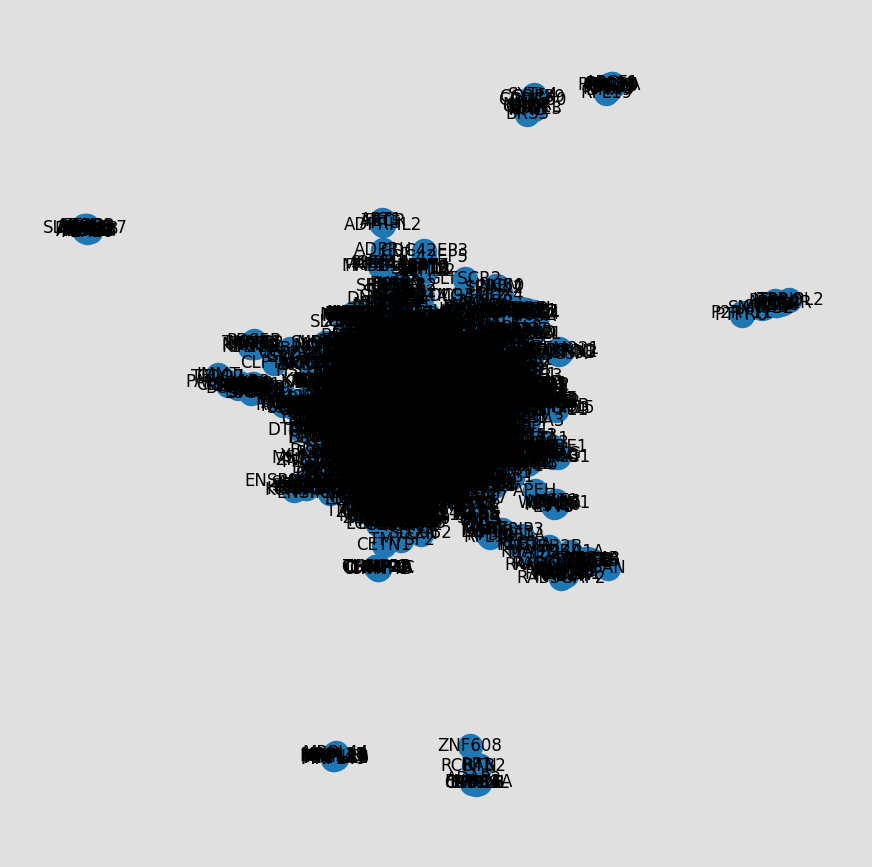

In [22]:
pos = nx.spring_layout(G) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G)
plt.axis('off')
plt.show()

In [23]:
def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G.degree(v) for v in G],0.0,0.9) 
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100] 
bc = nx.betweenness_centrality(G) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction 
ew = rescale([float(G[u][v]['weight']) for u,v in G.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G[u][v]['weight']) for u,v in G.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]

<ipython-input-23-d8cd3069e9aa>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


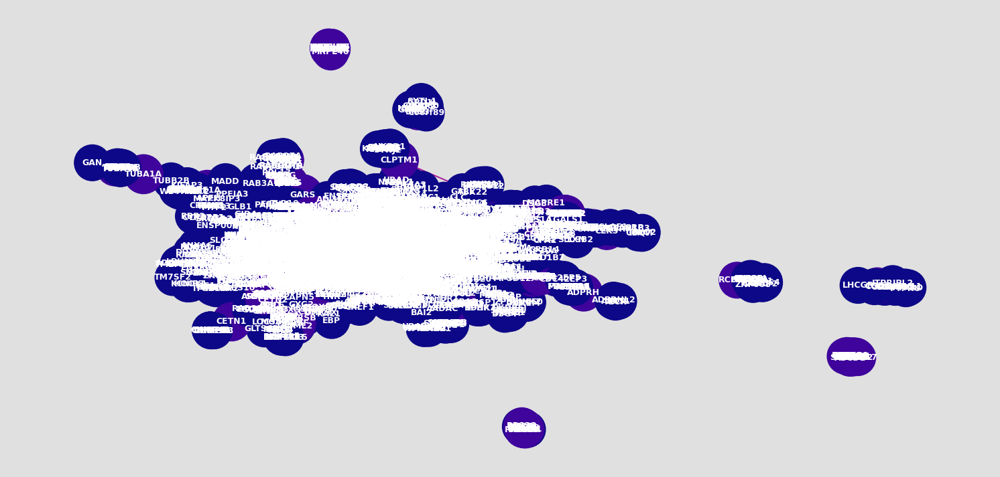

In [24]:
pos = nx.spring_layout(G)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()

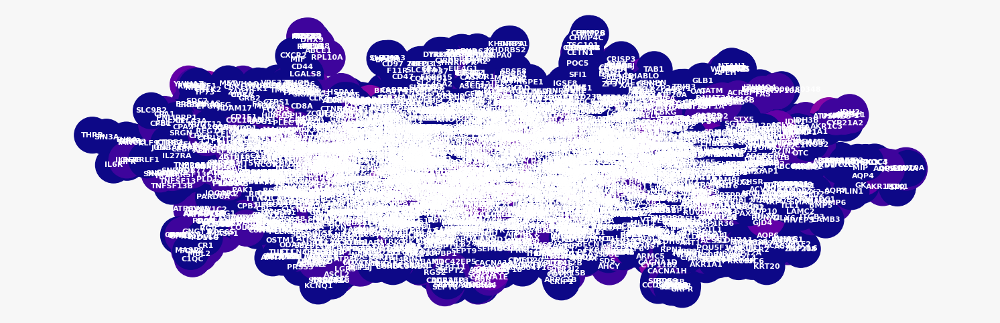

In [25]:
T = nx.minimum_spanning_tree(G)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()